In [2]:

using Distributions
using StatsPlots
using Random
using DataFrames
using StatsBase

using KernelDensity


In [3]:
normal_dist = Normal(0, 1)


Normal{Float64}(μ=0.0, σ=1.0)

In [4]:
normal_samples = rand(normal_dist, 1000)


1000-element Vector{Float64}:
 -0.2115043663202364
  1.5518788732819655
  1.6170394599646112
 -0.886413719337656
  0.805967292994571
  0.35893848100537534
  0.5145773773824952
 -0.8324568571996717
  0.11110580144421
  0.9356145048885997
  ⋮
 -0.4563913292566065
  0.9694035404196274
  2.1764259157630472
  0.412540145329486
 -0.3554851347378107
 -0.7124668028773146
  1.5312077124255998
  2.1552263503475215
 -1.5706884724671255

In [6]:
a = [1,2,3]
push!(a,4)
a

4-element Vector{Int64}:
 1
 2
 3
 4

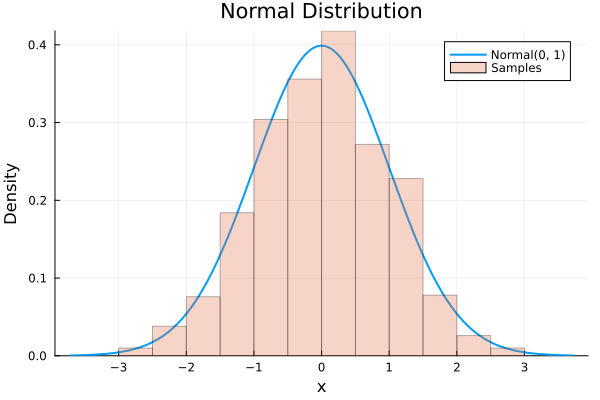

In [8]:
p1 = plot(
    normal_dist, 
    label="Normal(0, 1)", 
    title="Normal Distribution", 
    xlabel="x", 
    ylabel="Density",
    legend=:topright,
    linewidth=2
)

histogram!(
    p1,
    normal_samples, 
    alpha=0.3, 
    normalize=true, 
    label="Samples"
)


In [7]:
println("  Mean: $(mean(normal_dist))")
println("  Median: $(median(normal_dist))")
println("  Mode: $(mode(normal_dist))")
println("  Variance: $(var(normal_dist))")
println("  Standard Deviation: $(std(normal_dist))")
println("  Skewness: $(skewness(normal_dist))")
println("  Kurtosis: $(kurtosis(normal_dist))")


  Mean: 0.0
  Median: 0.0
  Mode: 0.0
  Variance: 1.0
  Standard Deviation: 1.0
  Skewness: 0.0
  Kurtosis: 0.0


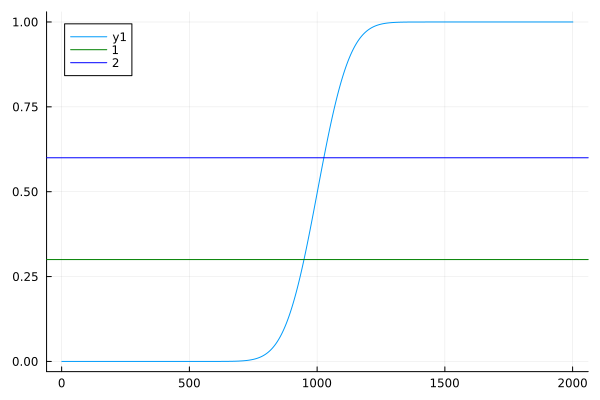

In [27]:
plot( cdf.(normal_dist, -10:0.01:10) )
hline!([0.3 0.6 ], color = [:green :blue], label = ["1" "2"])

In [10]:
println("  P(X ≤ 0): $(cdf(normal_dist, 0))")
println("  P(X ≤ 1): $(cdf(normal_dist, 1))")
println("  P(X ≤ 2): $(cdf(normal_dist, 2))")
println("  P(-1 ≤ X ≤ 1): $(cdf(normal_dist, 1) - cdf(normal_dist, -1))")


  P(X ≤ 0): 0.5
  P(X ≤ 1): 0.841344746068543
  P(X ≤ 2): 0.9772498680518208
  P(-1 ≤ X ≤ 1): 0.6826894921370861


In [32]:
println("  10th percentile: $(quantile(normal_dist, 0.1))")
println("  25th percentile: $(quantile(normal_dist, 0.25))")
println("  50th percentile: $(quantile(normal_dist, 0.5))")
println("  75th percentile: $(quantile(normal_dist, 0.75))")
println("  90th percentile: $(quantile(normal_dist, 0.9))")


  10th percentile: -1.2815515655446004
  25th percentile: -0.6744897501960818
  50th percentile: 0.0
  75th percentile: 0.6744897501960818
  90th percentile: 1.2815515655446004


In [33]:
uniform_dist = Uniform(0, 1)

Uniform{Float64}(a=0.0, b=1.0)

In [34]:
println("Uniform Distribution: a = $(minimum(uniform_dist)), b = $(maximum(uniform_dist))")



Uniform Distribution: a = 0.0, b = 1.0


In [36]:
uniform_samples = rand(uniform_dist, 1_000)


1000-element Vector{Float64}:
 0.4185635116479036
 0.44675791974713075
 0.9360200602350847
 0.04576916427913391
 0.2742221003907268
 0.1205618145578019
 0.9059481957076306
 0.6149693252304078
 0.9372981351198404
 0.29568588677594887
 ⋮
 0.5664328217696116
 0.4061180228711532
 0.3938328123824155
 0.11043757932514975
 0.4426580632716778
 0.9325505389589321
 0.39497945136018675
 0.8923549668102054
 0.04369525563027343

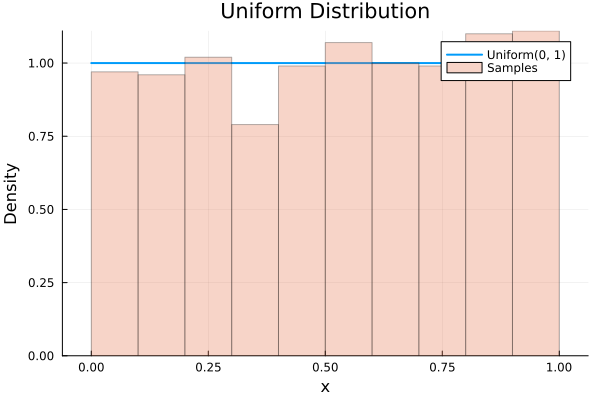

In [37]:
p2 = plot(
    uniform_dist, 
    label="Uniform(0, 1)", 
    title="Uniform Distribution", 
    xlabel="x", 
    ylabel="Density",
    legend=:topright,
    linewidth=2
)

histogram!(
    p2,
    uniform_samples, 
    alpha=0.3, 
    normalize=true, 
    label="Samples"
)


In [38]:
binomial_dist = Binomial(10, 0.5)


Binomial{Float64}(n=10, p=0.5)

In [39]:
println("Binomial Distribution: n = $(binomial_dist.n), p = $(binomial_dist.p)")


Binomial Distribution: n = 10, p = 0.5


In [40]:
binomial_samples = rand(binomial_dist, 10_000)


10000-element Vector{Int64}:
 6
 8
 6
 7
 4
 6
 5
 7
 5
 7
 ⋮
 6
 3
 6
 4
 7
 3
 1
 6
 4

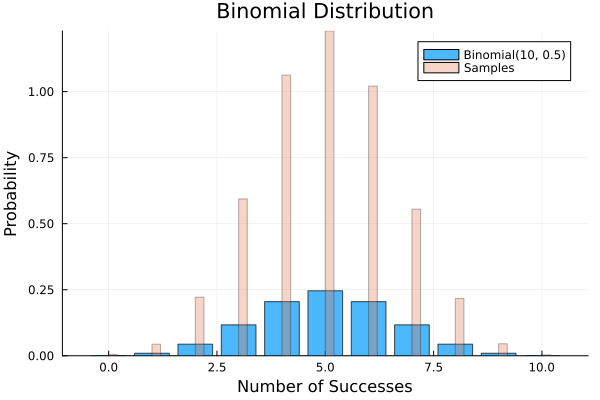

In [43]:
p3 = plot(
    0:10, 
    pdf.(binomial_dist, 0:10), 
    seriestype=:bar, 
    label="Binomial(10, 0.5)", 
    title="Binomial Distribution", 
    xlabel="Number of Successes", 
    ylabel="Probability",
    legend=:topright,
    alpha=0.7
)

histogram!(
    p3,
    binomial_samples, 
    alpha=0.3, 
    normalize=true, 
    label="Samples"
)

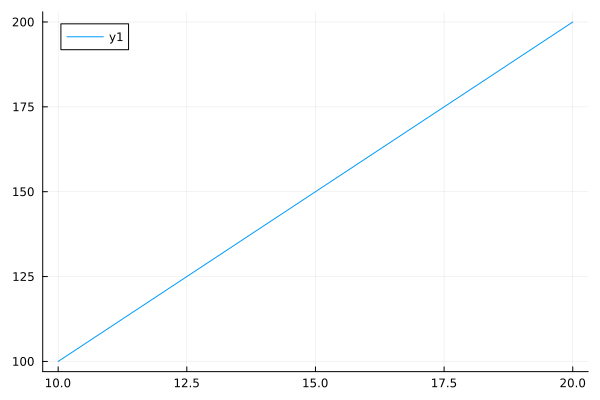

In [45]:
plot( 10:20, x-> x*10)

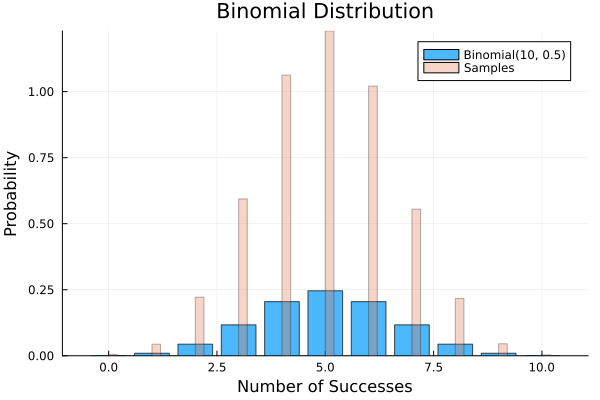

In [44]:
p3 = plot(
    0:10, 
    x -> pdf.(binomial_dist, x), 
    seriestype=:bar, 
    label="Binomial(10, 0.5)", 
    title="Binomial Distribution", 
    xlabel="Number of Successes", 
    ylabel="Probability",
    legend=:topright,
    alpha=0.7
)

histogram!(
    p3,
    binomial_samples, 
    alpha=0.3, 
    normalize=true, 
    label="Samples"
)

In [46]:
poisson_dist = Poisson(3)
println("Poisson Distribution: λ = $(poisson_dist.λ)")


Poisson Distribution: λ = 3.0


In [47]:
poisson_samples = rand(poisson_dist, 1000)


1000-element Vector{Int64}:
 5
 3
 3
 1
 1
 4
 1
 2
 2
 2
 ⋮
 7
 2
 0
 2
 1
 0
 1
 5
 2

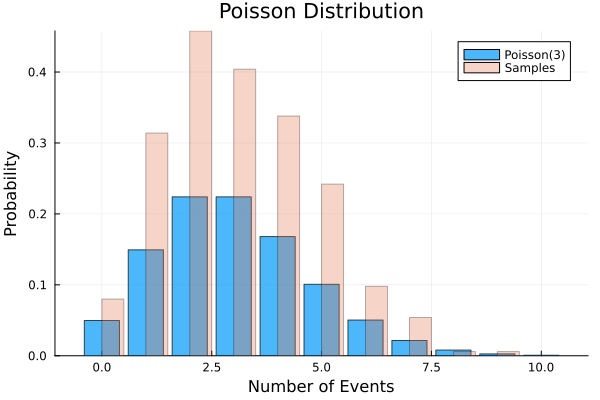

In [49]:
p4 = plot(
    0:10, 
    pdf.(poisson_dist, 0:10), 
    seriestype=:bar, 
    label="Poisson(3)", 
    title="Poisson Distribution", 
    xlabel="Number of Events", 
    ylabel="Probability",
    legend=:topright,
    alpha=0.7
)

histogram!(
    p4,
    poisson_samples, 
    alpha=0.3, 
    normalize=true, 
    label="Samples"
)

In [50]:
println("Probabilities for Poisson(3):")
println("  P(X = 3): $(pdf(poisson_dist, 3))")
println("  P(X ≤ 3): $(cdf(poisson_dist, 3))")
println("  P(X ≥ 3): $(1 - cdf(poisson_dist, 2))")
println("  P(1 ≤ X ≤ 5): $(cdf(poisson_dist, 5) - cdf(poisson_dist, 0))")


Probabilities for Poisson(3):
  P(X = 3): 0.22404180765538775
  P(X ≤ 3): 0.6472318887822313
  P(X ≥ 3): 0.5768099188731565
  P(1 ≤ X ≤ 5): 0.8662949896008326


In [51]:
exponential_dist = Exponential(1/0.5)

Exponential{Float64}(θ=2.0)

In [52]:
exponential_samples = rand(exponential_dist, 1000)


1000-element Vector{Float64}:
 0.507053376509169
 0.81775452129375
 1.080337024490162
 7.717323797270324
 0.4249622885775933
 1.2459579349110634
 1.0263325276059074
 2.513006932220077
 0.5372601862857914
 0.019091618059772286
 ⋮
 3.536990971408554
 2.292123256420584
 1.8410569130924745
 0.4217474135621692
 0.7388193058691753
 1.286432267518086
 0.6310232206346958
 3.085396522053265
 0.03419585917247006

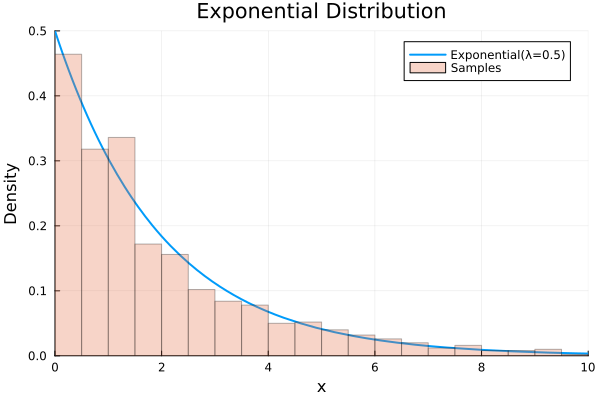

In [53]:
p5 = plot(
    exponential_dist, 
    label="Exponential(λ=0.5)", 
    title="Exponential Distribution", 
    xlabel="x", 
    ylabel="Density",
    legend=:topright,
    linewidth=2,
    xlims=(0, 10)
)

histogram!(
    p5,
    exponential_samples, 
    alpha=0.3, 
    normalize=true, 
    label="Samples"
)


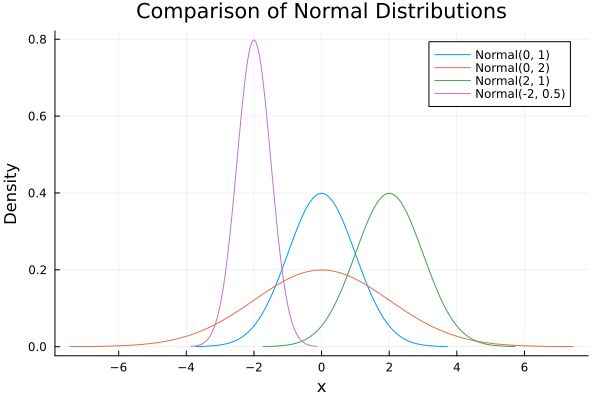

In [54]:
p6 = plot(
    title="Comparison of Normal Distributions",
    xlabel="x",
    ylabel="Density",
    legend=:topright,
    linewidth=2
)

plot!(p6, Normal(0, 1), label="Normal(0, 1)")
plot!(p6, Normal(0, 2), label="Normal(0, 2)")
plot!(p6, Normal(2, 1), label="Normal(2, 1)")
plot!(p6, Normal(-2, 0.5), label="Normal(-2, 0.5)")


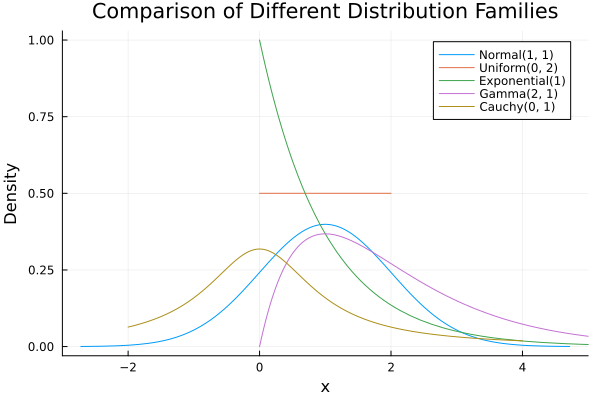

In [55]:
p7 = plot(
    title="Comparison of Different Distribution Families",
    xlabel="x",
    ylabel="Density",
    legend=:topright,
    linewidth=2,
    xlims=(-3, 5)
)

plot!(p7, Normal(1, 1), label="Normal(1, 1)")
plot!(p7, Uniform(0, 2), label="Uniform(0, 2)")
plot!(p7, Exponential(1), label="Exponential(1)")
plot!(p7, Gamma(2, 1), label="Gamma(2, 1)")
plot!(p7, -2:0.01:4, Cauchy(0, 1), label="Cauchy(0, 1)")


In [56]:
μ = [0, 0] 
Σ = [1 0.5; 0.5 1] 
mvnormal_dist = MvNormal(μ, Σ)

FullNormal(
dim: 2
μ: [0.0, 0.0]
Σ: [1.0 0.5; 0.5 1.0]
)


In [57]:
mvnormal_samples = rand(mvnormal_dist, 1000)


2×1000 Matrix{Float64}:
 -0.204666  -1.02045    1.50548  …   1.17013    -0.892468  -1.19041
 -0.217127  -0.718788  -1.18687     -0.0143507  -0.104598  -1.57243

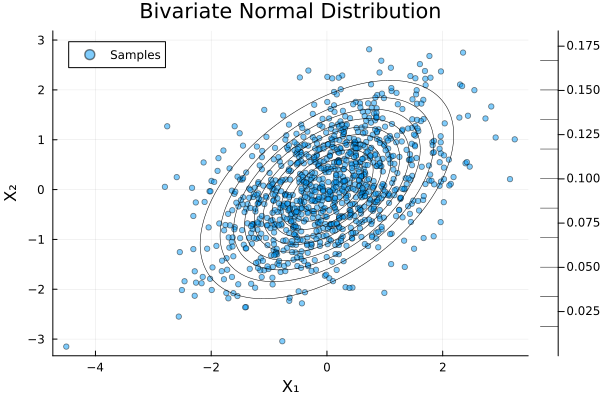

In [61]:
p8 = scatter(
    mvnormal_samples[1, :],
    mvnormal_samples[2, :],
    title="Bivariate Normal Distribution",
    xlabel="X₁",
    ylabel="X₂",
    label="Samples",
    alpha=0.5,
    markersize=3
)

x = range(-3, 3, length=100)
y = range(-3, 3, length=100)
z = [pdf(mvnormal_dist, [i, j]) for i in x, j in y]
contour!(p8, x, y, z, levels=10, color=:black, linewidth=0.5, label="pdf", legend=true)


In [64]:
mix_weights = [0.7, 0.3]
mix_components = [Normal(-2, 1), Normal(2, 0.5)]
mix_dist = MixtureModel(mix_components, mix_weights)

mix_samples = rand(mix_dist, 1000);


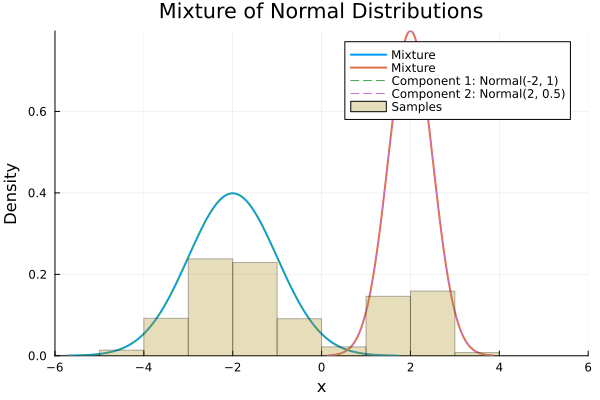

In [63]:
p9 = plot(
    mix_dist,
    label="Mixture",
    title="Mixture of Normal Distributions",
    xlabel="x",
    ylabel="Density",
    legend=:topright,
    linewidth=2,
    xlims=(-6, 6)
)

plot!(p9, mix_components[1], label="Component 1: Normal(-2, 1)", linestyle=:dash)
plot!(p9, mix_components[2], label="Component 2: Normal(2, 0.5)", linestyle=:dash)

histogram!(
    p9,
    mix_samples,
    alpha=0.3,
    normalize=true,
    label="Samples"
)


In [66]:
n = 10
p = 0.3
binom_dist = Binomial(n, p)

# PMF values
x_values = 0:n
pmf_values = pdf.(binom_dist, x_values);


In [67]:
pmf_df = DataFrame(
    x = x_values,
    pmf = pmf_values,
    cumulative_prob = cumsum(pmf_values)
)


Row,x,pmf,cumulative_prob
,Int64,Float64,Float64
1,0,0.0282475,0.0282475
2,1,0.121061,0.149308
3,2,0.233474,0.382783
4,3,0.266828,0.649611
5,4,0.200121,0.849732
6,5,0.102919,0.952651
7,6,0.0367569,0.989408
8,7,0.00900169,0.99841
9,8,0.0014467,0.999856


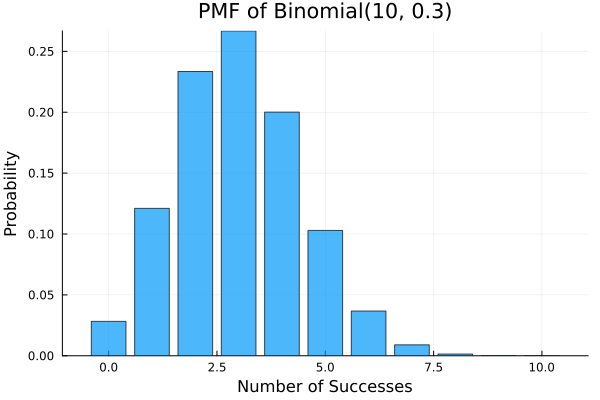

In [38]:
p1 = plot(
    x_values,
    pmf_values,
    seriestype=:bar,
    title="PMF of Binomial(10, 0.3)",
    xlabel="Number of Successes",
    ylabel="Probability",
    legend=false,
    alpha=0.7
)


In [70]:
isapprox(sum(pmf_values), 1.0, atol=1e-10)

true

In [72]:
μ = 0
σ = 1
normal_dist = Normal(μ, σ)

x_range = range(-4, 4, length=100)
pdf_values = pdf.(normal_dist, x_range);


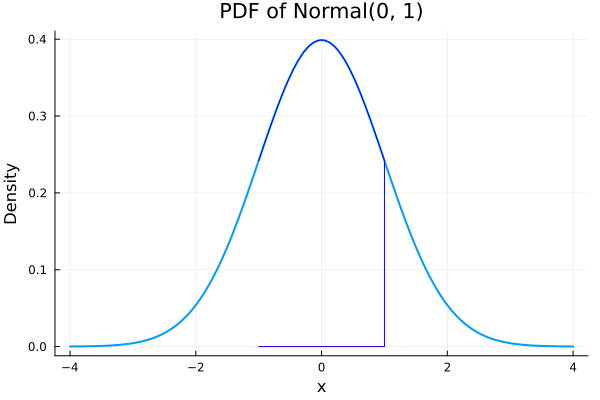

In [73]:
p2 = plot(
    x_range,
    pdf_values,
    title="PDF of Normal(0, 1)",
    xlabel="x",
    ylabel="Density",
    legend=false,
    linewidth=2
)

#an area under the curve to represent probability
x_interval = range(-1, 1, length=50)
area_x = [x_interval; reverse(x_interval)]
area_y = [pdf.(normal_dist, x_interval); zeros(length(x_interval))]

plot!(
    p2,
    area_x,
    area_y,
    fillalpha=0.3,
    fillcolor=:blue,
    linecolor=:blue,
    label="P(-1 ≤ X ≤ 1) = $(round(cdf(normal_dist, 1) - cdf(normal_dist, -1), digits=4))"
)

In [76]:
a, b = -1, 1
prob = cdf(normal_dist, b) - cdf(normal_dist, a)
println("  P(-1 ≤ X ≤ 1) = $(prob)")

  P(-1 ≤ X ≤ 1) = 0.6826894921370861


In [77]:
cdf_values = cdf.(normal_dist, x_range)

100-element Vector{Float64}:
 3.1671241833119884e-5
 4.442317421618728e-5
 6.192338952477743e-5
 8.57837169203925e-5
 0.00011810398997182316
 0.00016159898247362383
 0.00021975157971712282
 0.000296995550182663
 0.0003989311022582078
 0.0005325760012861637
 ⋮
 0.9996010688977418
 0.9997030044498173
 0.9997802484202829
 0.9998384010175264
 0.9998818960100282
 0.9999142162830796
 0.9999380766104752
 0.9999555768257838
 0.9999683287581669

In [86]:
using Colors

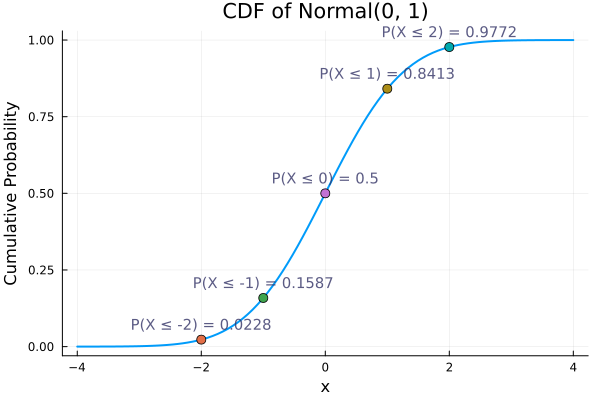

In [89]:
p3 = plot(
    x_range,
    cdf_values,
    title="CDF of Normal(0, 1)",
    xlabel="x",
    ylabel="Cumulative Probability",
    legend=false,
    linewidth=2
)

for x in [-2, -1, 0, 1, 2]
    scatter!(
        p3,
        [x],
        [cdf(normal_dist, x)],
        label="",
        markersize=5
    )
    annotate!(
        p3,
        [(x, cdf(normal_dist, x) + 0.05, text("P(X ≤ $(x)) = $(round(cdf(normal_dist, x), digits=4))", 10, RGBA(0.2,0.2,0.4,0.8)))]
    )
end
p3

In [90]:
(cdf(normal_dist, 0))

0.5

In [91]:
1 - cdf(normal_dist, 0)

0.5

In [92]:
cdf(normal_dist, 1) - cdf(normal_dist, -1)

0.6826894921370861

In [93]:
sample_size = 100
normal_sample = rand(normal_dist, sample_size)


100-element Vector{Float64}:
  0.199281478398885
  1.0366449623015768
 -0.49666965152647247
 -0.4571418063500196
 -0.26004018559061876
  0.5209521729802695
  0.7283859935159067
 -0.6714439039330897
  1.3834785031659462
  0.4967360664961308
  ⋮
 -1.8114903160524483
 -0.013032364717992012
 -0.15995672623962875
  0.17590008148634034
 -0.5043389074690513
  0.18150332552301704
 -1.0110509073370315
  0.004994164995963675
  0.8826417991035627

In [94]:
ecdf_obj = ecdf(normal_sample)
ecdf_x = sort(unique(normal_sample))
ecdf_y = ecdf_obj(ecdf_x)


100-element Vector{Float64}:
 0.01
 0.02
 0.03
 0.04
 0.05
 0.06
 0.07
 0.08
 0.09
 0.1
 ⋮
 0.92
 0.93
 0.94
 0.95
 0.96
 0.97
 0.98
 0.99
 1.0

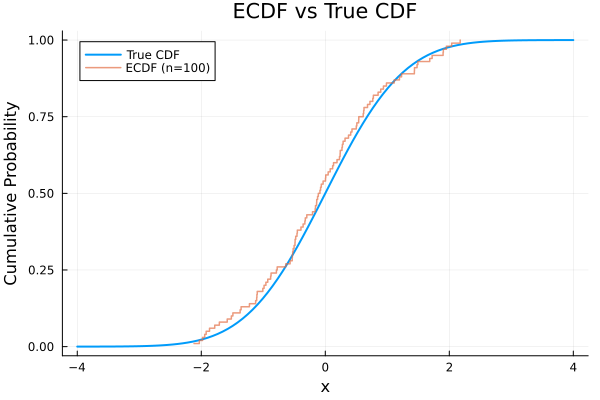

In [53]:
p4 = plot(
    x_range,
    cdf_values,
    title="ECDF vs True CDF",
    xlabel="x",
    ylabel="Cumulative Probability",
    label="True CDF",
    linewidth=2
)

# ECDF
plot!(
    p4,
    ecdf_x,
    ecdf_y,
    seriestype=:steppost,
    label="ECDF (n=$(sample_size))",
    linewidth=1.5,
    alpha=0.7
)

In [95]:
μ = [0, 0]
Σ = [1 0.7; 0.7 1] 
mvnormal_dist = MvNormal(μ, Σ)


FullNormal(
dim: 2
μ: [0.0, 0.0]
Σ: [1.0 0.7; 0.7 1.0]
)


In [96]:
n_samples = 1000
samples = rand(mvnormal_dist, n_samples)
x_samples = samples[1, :]
y_samples = samples[2, :]


1000-element Vector{Float64}:
  0.6523420216194968
 -1.675645015256869
  0.9820844341214523
  0.6689038007233811
 -1.080502662834873
 -1.308774391218613
  0.09535769070926609
 -1.0014561938368491
 -0.6059201859447576
 -1.1652004137731695
  ⋮
 -0.8861704530769985
 -0.7565602378497294
  1.3843799140779747
 -1.7344886822210661
 -1.4269782617525677
  1.2241447934751628
  1.0885531657729008
 -0.5678306587427515
 -0.6406813489429152

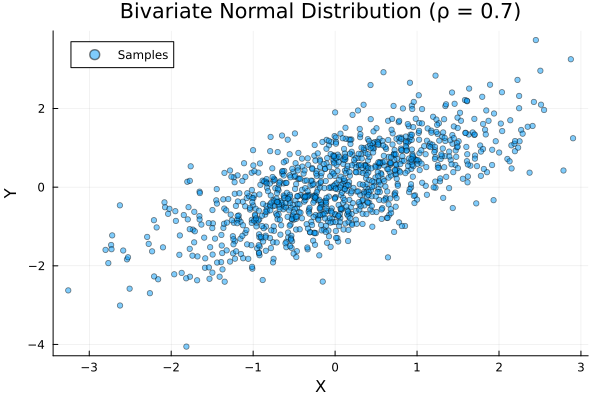

In [97]:
p5 = scatter(
    x_samples,
    y_samples,
    title="Bivariate Normal Distribution (ρ = 0.7)",
    xlabel="X",
    ylabel="Y",
    label="Samples",
    alpha=0.5,
    markersize=3
)


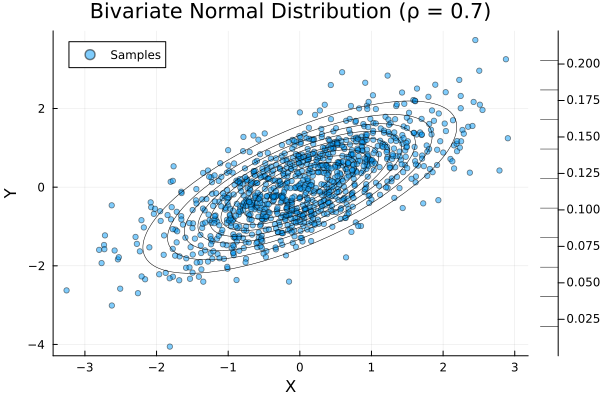

In [98]:
x_grid = range(-3, 3, length=100)
y_grid = range(-3, 3, length=100)
z = [pdf(mvnormal_dist, [x, y]) for x in x_grid, y in y_grid]
contour!(p5, x_grid, y_grid, z, levels=10, color=:black, linewidth=0.5, label="Joint PDF")


In [99]:
x_marginal = Normal(μ[1], sqrt(Σ[1, 1]))
y_marginal = Normal(μ[2], sqrt(Σ[2, 2]))


Normal{Float64}(μ=0.0, σ=1.0)

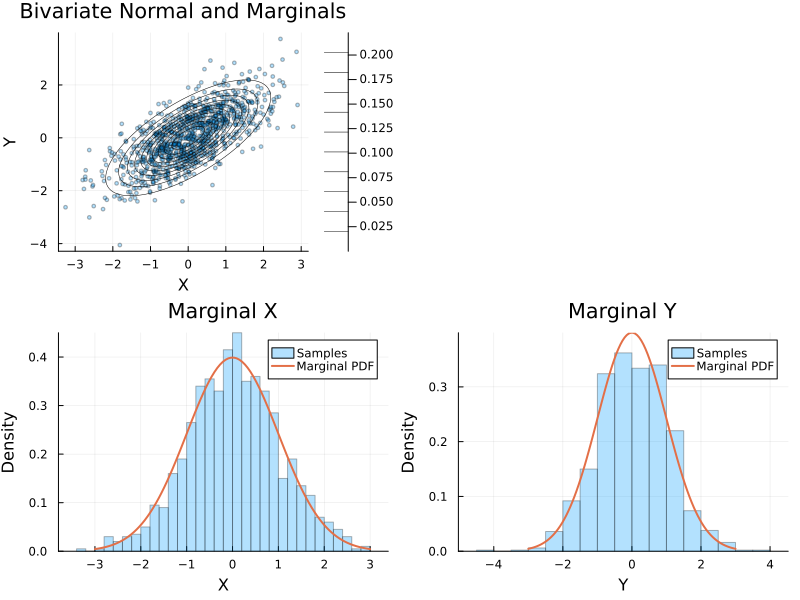

In [100]:
p6 = plot(
    layout=(2, 2),
    size=(800, 600),
    title=["Bivariate Normal and Marginals" "" "Marginal X" "Marginal Y"]
)
scatter!(
    p6[1],
    x_samples,
    y_samples,
    xlabel="X",
    ylabel="Y",
    label="",
    alpha=0.3,
    markersize=2
)
contour!(p6[1], x_grid, y_grid, z, levels=10, color=:black, linewidth=0.5, label="")

plot!(p6[2], legend=false, grid=false, ticks=false, foreground_color_subplot=:white)

histogram!(
    p6[3],
    x_samples,
    normalize=true,
    xlabel="X",
    ylabel="Density",
    label="Samples",
    alpha=0.3,
    bins=30
)
plot!(p6[3], x_grid, pdf.(x_marginal, x_grid), linewidth=2, label="Marginal PDF")

histogram!(
    p6[4],
    y_samples,
    normalize=true,
    xlabel="Y",
    ylabel="Density",
    label="Samples",
    alpha=0.3,
    bins=30
)
plot!(p6[4], x_grid, pdf.(y_marginal, x_grid), linewidth=2, label="Marginal PDF")

In [61]:
p_heads = 0.7
p_tails = 1 - p_heads

p_hh = p_heads * p_heads 
p_ht = p_heads * p_tails 
p_th = p_tails * p_heads 
p_tt = p_tails * p_tails 


0.09000000000000002

# Bayes

In [101]:
p_disease = 0.01  # Prior of having the disease
p_positive_given_disease = 0.95  # Sensitivity: P(positive test | disease)
p_negative_given_no_disease = 0.90  # Specificity: P(negative test | no disease)
p_positive_given_no_disease = 1 - p_negative_given_no_disease  # False positive dsrate


0.09999999999999998

In [67]:
# probability of a positive test
p_positive = p_positive_given_disease * p_disease + p_positive_given_no_disease * (1 - p_disease)

0.10849999999999997

In [68]:

#Bayes' Theorem to find P(disease | positive test)
p_disease_given_positive = (p_positive_given_disease * p_disease) / p_positive

println("P(disease) = $(p_disease) (prior)")
println("P(positive test | disease) = $(p_positive_given_disease) (sensitivity)")
println("P(negative test | no disease) = $(p_negative_given_no_disease) (specificity)")
println("P(positive test) = $(round(p_positive, digits=4))")
println("P(disease | positive test) = $(round(p_disease_given_positive, digits=4)) (posterior)")


P(disease) = 0.01 (prior)
P(positive test | disease) = 0.95 (sensitivity)
P(negative test | no disease) = 0.9 (specificity)
P(positive test) = 0.1085
P(disease | positive test) = 0.0876 (posterior)


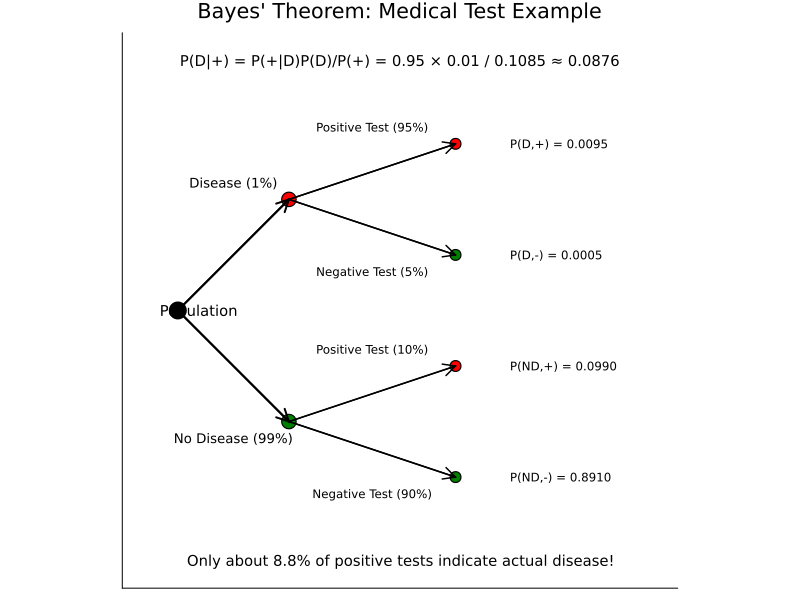

In [102]:
p7 = plot(
    title="Bayes' Theorem: Medical Test Example",
    legend=false,
    grid=false,
    ticks=false,
    xlims=(0, 10),
    ylims=(0, 10),
    aspect_ratio=:equal,
    size=(800, 600)
)


scatter!(p7, [1], [5], markersize=10, color=:black)
annotate!(p7, [(0.7, 5, text("Population", 10, :left))])

#1 level: Disease vs No Disease
scatter!(p7, [3], [7], markersize=8, color=:red)
scatter!(p7, [3], [3], markersize=8, color=:green)
plot!(p7, [1, 3], [5, 7], linewidth=2, color=:black, arrow=true)
plot!(p7, [1, 3], [5, 3], linewidth=2, color=:black, arrow=true)
annotate!(p7, [(2, 7.3, text("Disease (1%)", 9, :center))])
annotate!(p7, [(2, 2.7, text("No Disease (99%)", 9, :center))])

# 2 level: Test results for Disease
scatter!(p7, [6], [8], markersize=6, color=:red)
scatter!(p7, [6], [6], markersize=6, color=:green)
plot!(p7, [3, 6], [7, 8], linewidth=1.5, color=:black, arrow=true)
plot!(p7, [3, 6], [7, 6], linewidth=1.5, color=:black, arrow=true)
annotate!(p7, [(4.5, 8.3, text("Positive Test (95%)", 8, :center))])
annotate!(p7, [(4.5, 5.7, text("Negative Test (5%)", 8, :center))])

# 2 level: Test results for No Disease
scatter!(p7, [6], [4], markersize=6, color=:red)
scatter!(p7, [6], [2], markersize=6, color=:green)
plot!(p7, [3, 6], [3, 4], linewidth=1.5, color=:black, arrow=true)
plot!(p7, [3, 6], [3, 2], linewidth=1.5, color=:black, arrow=true)
annotate!(p7, [(4.5, 4.3, text("Positive Test (10%)", 8, :center))])
annotate!(p7, [(4.5, 1.7, text("Negative Test (90%)", 8, :center))])

# Final probabilities
annotate!(p7, [(7, 8, text("P(D,+) = 0.0095", 8, :left))])
annotate!(p7, [(7, 6, text("P(D,-) = 0.0005", 8, :left))])
annotate!(p7, [(7, 4, text("P(ND,+) = 0.0990", 8, :left))])
annotate!(p7, [(7, 2, text("P(ND,-) = 0.8910", 8, :left))])

# Highlight the Bayes' Theorem calculation
annotate!(p7, [(5, 9.5, text("P(D|+) = P(+|D)P(D)/P(+) = 0.95 × 0.01 / 0.1085 ≈ 0.0876", 10, :center))])
annotate!(p7, [(5, 0.5, text("Only about 8.8% of positive tests indicate actual disease!", 10, :center))])


In [103]:
mix_weights = [0.6, 0.4]
mix_components = [Normal(-2, 0.8), Normal(2, 0.5)]
mix_dist = MixtureModel(mix_components, mix_weights)


MixtureModel{Normal{Float64}}(K = 2)
components[1] (prior = 0.6000): Normal{Float64}(μ=-2.0, σ=0.8)
components[2] (prior = 0.4000): Normal{Float64}(μ=2.0, σ=0.5)


In [104]:
sample_size = 500
mix_sample = rand(mix_dist, sample_size)


500-element Vector{Float64}:
 -2.411094326432708
 -2.0090809673786465
 -2.371231921070666
  2.2355616351390206
 -2.416156742983205
  3.1449840512232745
  2.5125142328258026
 -1.1887065561008667
 -2.8222702260285746
 -0.7965618871518216
  ⋮
  2.5717035208587387
  1.3143162294637734
  1.4225022374225222
 -3.1771995099119743
  1.8681782330462882
 -2.3948829196972348
 -1.7408054300731508
  1.4630033323637732
 -0.8565887721247522

In [107]:
population_size = 10000
μ = 100
σ = 15
population = rand(Normal(μ, σ), population_size)


10000-element Vector{Float64}:
 103.26765722279131
  89.04755590523378
  83.5028604170629
  99.29466406908357
  94.8326631206368
 110.05885216372992
 134.80114445355395
  88.1611285139848
 119.2625209352387
  83.70361992765555
   ⋮
 103.56286612222146
 104.27540415614658
  97.32187388041864
 107.53124607743266
 112.67501553374318
 129.20163365914757
 101.87844039494189
  85.58874160747297
 105.22657170345813

In [108]:
sample_size = 100
simple_sample = sample(population, sample_size, replace=false)

100-element Vector{Float64}:
  77.45941289267896
  95.95963959871742
  93.09728396157404
  76.18081513431464
 109.94387873271512
 118.62771526404376
  83.02067020990599
 112.77758781590828
 119.59796419805359
 100.51018485365526
   ⋮
 105.24863906956567
  94.47569774281592
  89.1237905367318
 103.89253068136063
  90.8930751547673
 120.67282757720076
 118.84722919903375
 121.29741105562786
  94.77438487115262

In [109]:
population_mean = mean(population)
population_std = std(population)
sample_mean = mean(simple_sample)
sample_std = std(simple_sample)

13.784638739327454

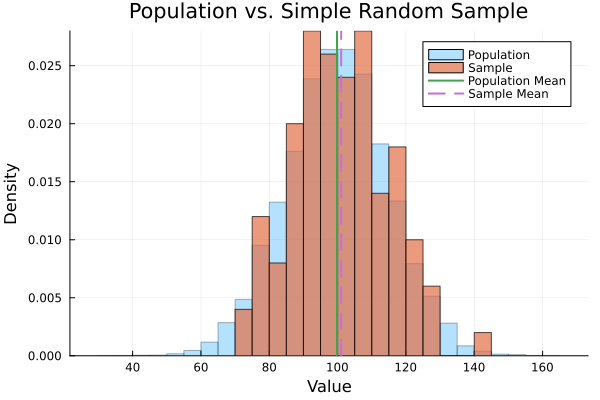

In [110]:
p1 = histogram(
    population,
    alpha=0.3,
    label="Population",
    normalize=true,
    title="Population vs. Simple Random Sample",
    xlabel="Value",
    ylabel="Density",
    bins=50
)

histogram!(
    p1,
    simple_sample,
    alpha=0.7,
    label="Sample",
    normalize=true,
    bins=15
)
vline!(p1, [population_mean], label="Population Mean", linewidth=2)
vline!(p1, [sample_mean], label="Sample Mean", linewidth=2, linestyle=:dash)


In [111]:
sorted_population = sort(population)

# the sampling interval
k = div(population_size, sample_size)
println("Sampling interval (k): $k")


Sampling interval (k): 100


In [112]:
systematic_sample = [sorted_population[i] for i in 1:k:population_size if i <= population_size]
if length(systematic_sample) > sample_size
    systematic_sample = systematic_sample[1:sample_size]
end

systematic_mean = mean(systematic_sample)
systematic_std = std(systematic_sample)


15.919127146006895

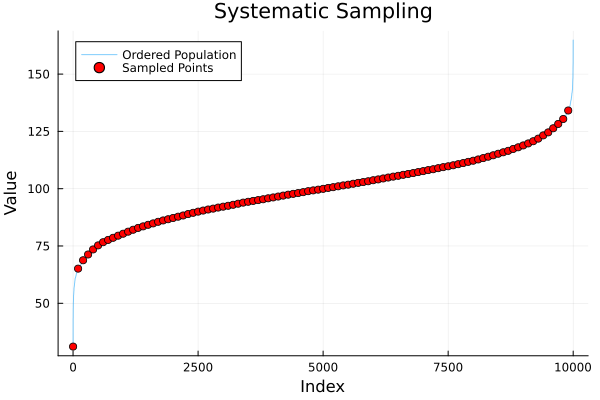

In [113]:
p2 = plot(
    1:population_size,
    sorted_population,
    label="Ordered Population",
    title="Systematic Sampling",
    xlabel="Index",
    ylabel="Value",
    alpha=0.5,
    linewidth=1
)

scatter!(
    p2,
    [i for i in 1:k:population_size if i <= population_size][1:length(systematic_sample)],
    systematic_sample,
    label="Sampled Points",
    markersize=4,
    color=:red
)


In [114]:
population1 = rand(Normal(80, 10), div(population_size, 2))
population2 = rand(Normal(120, 10), div(population_size, 2))
bimodal_population = vcat(population1, population2)


10000-element Vector{Float64}:
  66.38853029105378
  83.14191178589539
  74.68800129739812
  77.45411984146409
  89.1427825743377
  76.33698274857558
  78.67184382601609
  92.03881353543697
  82.0833807175883
  74.9322204890262
   ⋮
 110.68060769826504
 117.81860220184912
 112.50197310403337
 115.5423995402798
 131.36777181685946
 123.80459796728967
 132.56673005134854
 113.20681207036921
 130.68303293917722

In [115]:
threshold = 100
stratum1 = filter(x -> x < threshold, bimodal_population)
stratum2 = filter(x -> x >= threshold, bimodal_population)


5006-element Vector{Float64}:
 101.70422697787377
 101.25177093311814
 105.18501465437532
 106.11926329202849
 107.66409419505966
 107.20586353843996
 101.07172664273874
 100.62912291896122
 107.5595461746318
 100.22017973335085
   ⋮
 110.68060769826504
 117.81860220184912
 112.50197310403337
 115.5423995402798
 131.36777181685946
 123.80459796728967
 132.56673005134854
 113.20681207036921
 130.68303293917722

In [116]:
prop1 = length(stratum1) / length(bimodal_population)
prop2 = length(stratum2) / length(bimodal_population)
sample_size1 = round(Int, prop1 * sample_size)
sample_size2 = sample_size - sample_size1


50

In [117]:
stratified_sample1 = sample(stratum1, sample_size1, replace=false)
stratified_sample2 = sample(stratum2, sample_size2, replace=false)
stratified_sample = vcat(stratified_sample1, stratified_sample2)


100-element Vector{Float64}:
  68.72235898136367
  84.0908734120075
  89.36611196076933
  82.82149808871755
  69.94824124088066
  78.87746773909771
  80.1582033090059
  89.2992301894372
  87.23590872111728
  69.67905748441979
   ⋮
 133.00846731217882
 116.59864928507227
 111.11218463089786
 107.6879153435892
 117.95989433773302
 103.05395282735063
 108.8778300386656
 122.94737722321723
 121.11921021757449

In [118]:
simple_bimodal_sample = sample(bimodal_population, sample_size, replace=false)


100-element Vector{Float64}:
  71.73120999431558
 115.42145921013177
 126.76795910906829
  68.96198284305554
  85.4348815455577
  92.87538975282683
 125.46162082780411
 104.01533845999677
  77.37064509215017
  76.95814001375741
   ⋮
 120.42026917490921
  79.22301063569195
  72.20611487749689
 114.04550278227336
  61.26165811581138
 112.0605764028981
  69.84290428246435
  88.41801539626323
  68.18674637999167

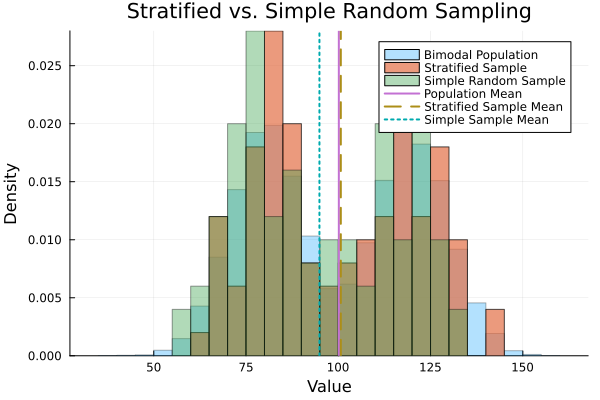

In [119]:
p3 = histogram(
    bimodal_population,
    alpha=0.3,
    label="Bimodal Population",
    normalize=true,
    title="Stratified vs. Simple Random Sampling",
    xlabel="Value",
    ylabel="Density",
    bins=50
)

histogram!(
    p3,
    stratified_sample,
    alpha=0.7,
    label="Stratified Sample",
    normalize=true,
    bins=15
)

histogram!(
    p3,
    simple_bimodal_sample,
    alpha=0.4,
    label="Simple Random Sample",
    normalize=true,
    bins=15
)

bimodal_mean = mean(bimodal_population)
stratified_mean = mean(stratified_sample)
simple_bimodal_mean = mean(simple_bimodal_sample)

vline!(p3, [bimodal_mean], label="Population Mean", linewidth=2)
vline!(p3, [stratified_mean], label="Stratified Sample Mean", linewidth=2, linestyle=:dash)
vline!(p3, [simple_bimodal_mean], label="Simple Sample Mean", linewidth=2, linestyle=:dot)

In [120]:
n_clusters = 50
cluster_size = 200
cluster_means = rand(Normal(100, 20), n_clusters)
clustered_population = Float64[]

for i in 1:n_clusters
    cluster = rand(Normal(cluster_means[i], 5), cluster_size)
    append!(clustered_population, cluster)
end

# cluster IDs to each element
cluster_ids = repeat(1:n_clusters, inner=cluster_size)

# random clusters
n_selected_clusters = 5
selected_cluster_ids = sample(1:n_clusters, n_selected_clusters, replace=false)
println("Selected cluster IDs: $selected_cluster_ids")

# elements from selected clusters
cluster_sample = Float64[]
for id in selected_cluster_ids
    cluster_elements = clustered_population[(cluster_ids .== id)]
    append!(cluster_sample, cluster_elements)
end


clustered_mean = mean(clustered_population)
cluster_sample_mean = mean(cluster_sample)


Selected cluster IDs: [36, 27, 47, 30, 20]


108.88060740287288

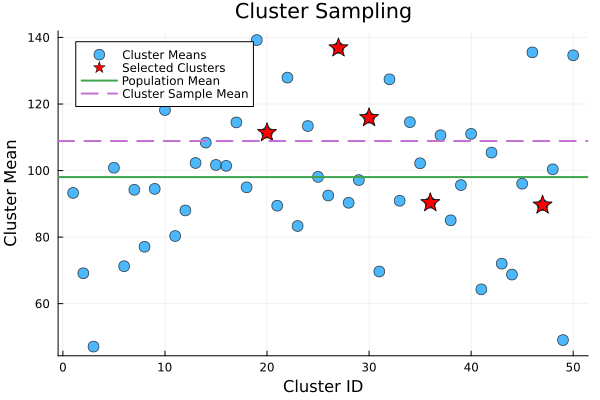

In [121]:
p4 = scatter(
    1:n_clusters,
    cluster_means,
    label="Cluster Means",
    title="Cluster Sampling",
    xlabel="Cluster ID",
    ylabel="Cluster Mean",
    alpha=0.7,
    markersize=6
)

scatter!(
    p4,
    selected_cluster_ids,
    cluster_means[selected_cluster_ids],
    label="Selected Clusters",
    markersize=10,
    markershape=:star,
    color=:red
)

hline!(p4, [clustered_mean], label="Population Mean", linewidth=2)
hline!(p4, [cluster_sample_mean], label="Cluster Sample Mean", linewidth=2, linestyle=:dash)


In [95]:
original_sample = sample(population, sample_size, replace=false)
original_mean = mean(original_sample)

n_bootstrap = 1000
bootstrap_means = Float64[]

for i in 1:n_bootstrap
    bootstrap_sample = sample(original_sample, sample_size, replace=true)
    push!(bootstrap_means, mean(bootstrap_sample))
end

bootstrap_mean_of_means = mean(bootstrap_means)
bootstrap_std_of_means = std(bootstrap_means)
bootstrap_ci = quantile(bootstrap_means, [0.025, 0.975])


2-element Vector{Float64}:
  99.32584663440073
 104.9392672071731

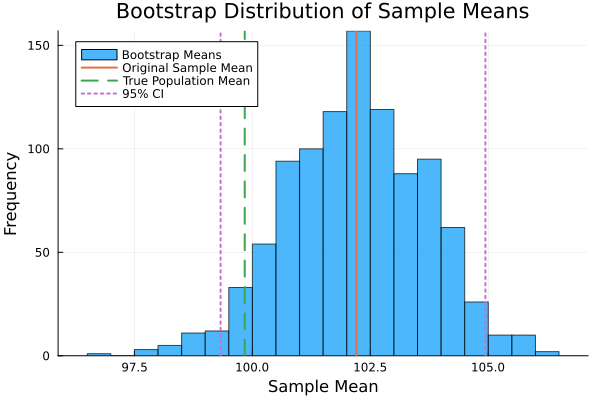

In [96]:
p5 = histogram(
    bootstrap_means,
    title="Bootstrap Distribution of Sample Means",
    xlabel="Sample Mean",
    ylabel="Frequency",
    label="Bootstrap Means",
    alpha=0.7,
    bins=30
)

vline!(p5, [original_mean], label="Original Sample Mean", linewidth=2)
vline!(p5, [population_mean], label="True Population Mean", linewidth=2, linestyle=:dash)
vline!(p5, [bootstrap_ci[1], bootstrap_ci[2]], label="95% CI", linewidth=2, linestyle=:dot)


In [128]:

function estimate_pi(n_points)
    inside_circle = 0
    
    for i in 1:n_points
        x = rand()
        y = rand()
        
        # see if point is inside unit circle
        if x^2 + y^2 <= 1
            inside_circle += 1
        end
    end
    
    # area of circle / area of square = π/4
    return 4 * inside_circle / n_points
end

n_points_list = [100, 1_000, 10_000, 100_000, 1_000_000]
pi_estimates = [estimate_pi(n) for n in n_points_list]


5-element Vector{Float64}:
 3.2
 3.104
 3.138
 3.13924
 3.141864

In [129]:
for (i, n) in enumerate(n_points_list)
    println("  n = $n: π ≈ $(round(pi_estimates[i], digits=6)) (error: $(round(abs(pi_estimates[i] - π), digits=6)))")
end

  n = 100: π ≈ 3.2 (error: 0.058407)
  n = 1000: π ≈ 3.104 (error: 0.037593)
  n = 10000: π ≈ 3.138 (error: 0.003593)
  n = 100000: π ≈ 3.13924 (error: 0.002353)
  n = 1000000: π ≈ 3.141864 (error: 0.000271)


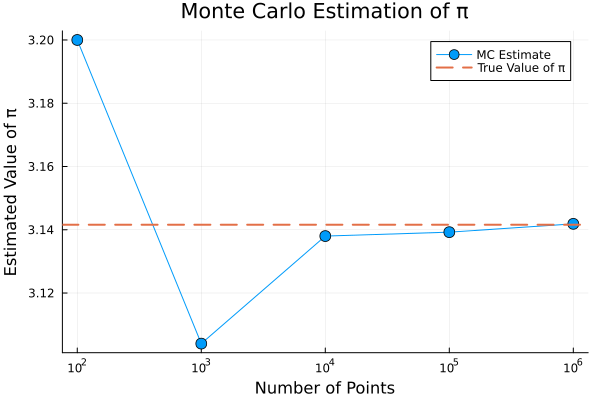

In [130]:
p6 = plot(
    n_points_list,
    pi_estimates,
    xscale=:log10,
    title="Monte Carlo Estimation of π",
    xlabel="Number of Points",
    ylabel="Estimated Value of π",
    label="MC Estimate",
    marker=:circle,
    markersize=6
)

hline!(p6, [π], label="True Value of π", linewidth=2, linestyle=:dash)


In [131]:

function monte_carlo_integrate(f, a, b, n_points)
    samples = rand(Uniform(a, b), n_points)
    function_values = f.(samples)
    
    # trying to estimate the integral
    return (b - a) * mean(function_values)
end


monte_carlo_integrate (generic function with 1 method)

In [133]:
#our function
f(x) = x^2

f (generic function with 1 method)

In [134]:
analytical_result = 1/3

# integration with different numbers of points
n_points_list = [100, 1000, 10000, 100000, 1000000]
integral_estimates = [monte_carlo_integrate(f, 0, 1, n) for n in n_points_list]



for (i, n) in enumerate(n_points_list)
    println("  n = $n: ∫ ≈ $(round(integral_estimates[i], digits=6)) (error: $(round(abs(integral_estimates[i] - analytical_result), digits=6)))")
end

  n = 100: ∫ ≈ 0.394741 (error: 0.061408)
  n = 1000: ∫ ≈ 0.336007 (error: 0.002674)
  n = 10000: ∫ ≈ 0.330896 (error: 0.002438)
  n = 100000: ∫ ≈ 0.333109 (error: 0.000224)
  n = 1000000: ∫ ≈ 0.333475 (error: 0.000142)


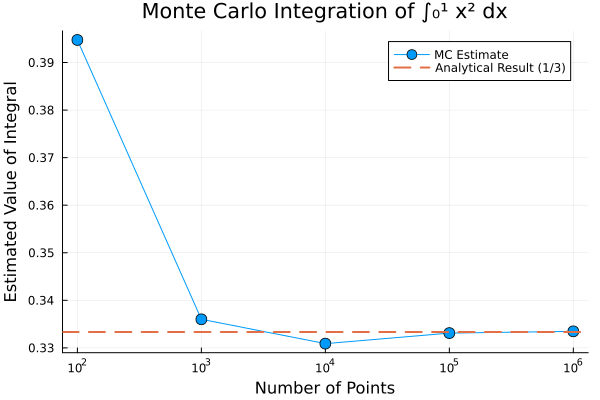

In [135]:
p7 = plot(
    n_points_list,
    integral_estimates,
    xscale=:log10,
    title="Monte Carlo Integration of ∫₀¹ x² dx",
    xlabel="Number of Points",
    ylabel="Estimated Value of Integral",
    label="MC Estimate",
    marker=:circle,
    markersize=6
)

hline!(p7, [analytical_result], label="Analytical Result (1/3)", linewidth=2, linestyle=:dash)


In [137]:
target_dist = Normal(5, 1)
proposal_dist = Normal(4, 2)

g(x) = x^2


g (generic function with 1 method)

In [107]:

function importance_sampling(g, target_dist, proposal_dist, n_samples)

    samples = rand(proposal_dist, n_samples)
    

    weights = pdf.(target_dist, samples) ./ pdf.(proposal_dist, samples)
    
    function_values = g.(samples)
    

    return sum(weights .* function_values) / sum(weights)
end

importance_sampling (generic function with 1 method)

In [108]:
analytical_result = var(target_dist) + mean(target_dist)^2

# importance sampling with different numbers of samples
n_samples_list = [100, 1000, 10000, 100000]
importance_estimates = [importance_sampling(g, target_dist, proposal_dist, n) for n in n_samples_list]

# 
for (i, n) in enumerate(n_samples_list)
    println("  n = $n: E[X²] ≈ $(round(importance_estimates[i], digits=4)) (error: $(round(abs(importance_estimates[i] - analytical_result), digits=4)))")
end


  n = 100: E[X²] ≈ 26.0606 (error: 0.0606)
  n = 1000: E[X²] ≈ 25.4805 (error: 0.5195)
  n = 10000: E[X²] ≈ 25.946 (error: 0.054)
  n = 100000: E[X²] ≈ 25.9972 (error: 0.0028)


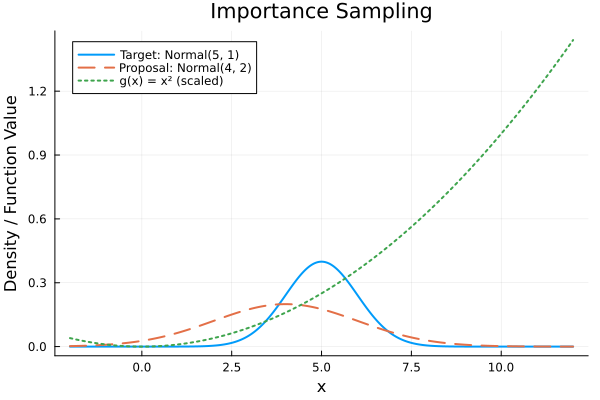

In [109]:
x_range = range(-2, 12, length=1000)
p8 = plot(
    x_range,
    pdf.(target_dist, x_range),
    title="Importance Sampling",
    xlabel="x",
    ylabel="Density / Function Value",
    label="Target: Normal(5, 1)",
    linewidth=2
)

plot!(
    p8,
    x_range,
    pdf.(proposal_dist, x_range),
    label="Proposal: Normal(4, 2)",
    linewidth=2,
    linestyle=:dash
)

plot!(
    p8,
    x_range,
    g.(x_range) ./ 100,
    label="g(x) = x² (scaled)",
    linewidth=2,
    linestyle=:dot
)

In [110]:
mix_weights = [0.7, 0.3]
mix_components = [Normal(-2, 1), Normal(2, 0.5)]
mix_dist = MixtureModel(mix_components, mix_weights)


MixtureModel{Normal{Float64}}(K = 2)
components[1] (prior = 0.7000): Normal{Float64}(μ=-2.0, σ=1.0)
components[2] (prior = 0.3000): Normal{Float64}(μ=2.0, σ=0.5)


In [111]:
proposal_dist = Uniform(-6, 6)


Uniform{Float64}(a=-6.0, b=6.0)

In [112]:
x_range = range(-6, 6, length=1000)
target_densities = pdf.(mix_dist, x_range)
proposal_densities = pdf.(proposal_dist, x_range)
ratios = target_densities ./ proposal_densities
M = maximum(ratios) * 1.1 

3.686226670909279

In [113]:

function rejection_sampling(target_dist, proposal_dist, M, n_samples)
    accepted_samples = Float64[]
    n_proposed = 0
    
    while length(accepted_samples) < n_samples

        x = rand(proposal_dist)
        n_proposed += 1
        

        if rand() < pdf(target_dist, x) / (M * pdf(proposal_dist, x))
            push!(accepted_samples, x)
        end
    end
    
    return accepted_samples, n_proposed
end

rejection_sampling (generic function with 1 method)

In [114]:
n_samples = 1000
rejection_samples, n_proposed = rejection_sampling(mix_dist, proposal_dist, M, n_samples)
acceptance_rate = n_samples / n_proposed

0.26688017080330934

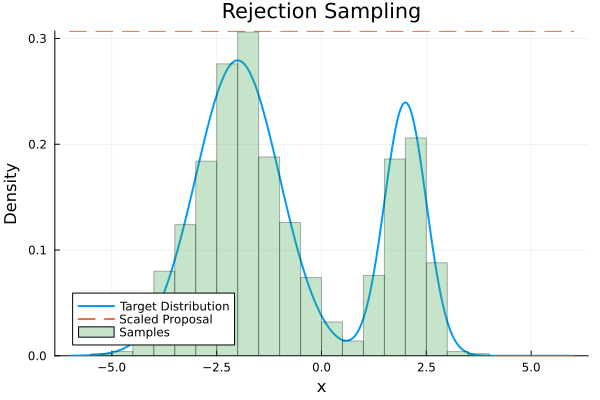

In [115]:
p9 = plot(
    x_range,
    pdf.(mix_dist, x_range),
    title="Rejection Sampling",
    xlabel="x",
    ylabel="Density",
    label="Target Distribution",
    linewidth=2
)

plot!(
    p9,
    x_range,
    M .* pdf.(proposal_dist, x_range),
    label="Scaled Proposal",
    linewidth=2,
    linestyle=:dash
)

histogram!(
    p9,
    rejection_samples,
    alpha=0.3,
    normalize=true,
    label="Samples",
    bins=30
)


In [138]:
using LinearAlgebra
using GLM


In [139]:
n = 100
x = range(0, 10, length=n)
β₀ = 2.5   
β₁ = 1.8   
ϵ = rand(Normal(0, 2), n)
y = β₀ .+ β₁ .* x .+ ϵ

100-element Vector{Float64}:
  4.381868528420562
  5.5032549150925565
  6.310109956953701
  4.619374680280153
  3.322528199033481
  3.322283380214261
  0.9668060776633758
  4.318820386961189
  6.104333749418096
  3.767417787246485
  ⋮
 21.850418853891373
 17.091341914573814
 18.751989732262306
 19.005569210895796
 21.10731771534059
 22.90252445960406
 19.52517685159698
 18.9961697525384
 22.69031348711025

In [140]:
df = DataFrame(X=x, Y=y)


Row,X,Y
,Float64,Float64
1,0.0,4.38187
2,0.10101,5.50325
3,0.20202,6.31011
4,0.30303,4.61937
5,0.40404,3.32253
6,0.505051,3.32228
7,0.606061,0.966806
8,0.707071,4.31882
9,0.808081,6.10433


In [141]:
simple_model = lm(@formula(Y ~ X), df)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

Y ~ 1 + X

Coefficients:
───────────────────────────────────────────────────────────────────────
               Coef.  Std. Error      t  Pr(>|t|)  Lower 95%  Upper 95%
───────────────────────────────────────────────────────────────────────
(Intercept)  2.30534    0.372051   6.20    <1e-07    1.56702    3.04367
X            1.81077    0.064279  28.17    <1e-48    1.68321    1.93833
───────────────────────────────────────────────────────────────────────

In [142]:
r2(simple_model)

0.8900822084386686

In [143]:
y_pred = predict(simple_model)

100-element Vector{Float64}:
  2.30534220258844
  2.4882483162238853
  2.671154429859331
  2.854060543494776
  3.0369666571302214
  3.219872770765667
  3.4027788844011124
  3.585684998036558
  3.768591111672003
  3.951497225307449
  ⋮
 18.949798543413976
 19.132704657049416
 19.31561077068487
 19.49851688432031
 19.681422997955757
 19.864329111591204
 20.047235225226643
 20.230141338862097
 20.413047452497537

In [144]:
r2a = r2(simple_model)


0.8900822084386686

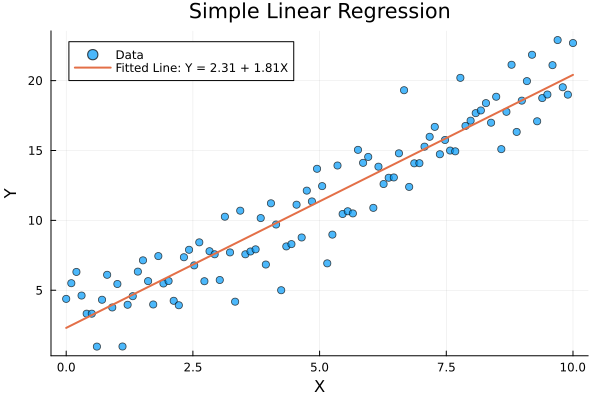

In [145]:
p1 = scatter(
    x, y,
    title="Simple Linear Regression",
    xlabel="X",
    ylabel="Y",
    label="Data",
    alpha=0.7
)
coefs = coef(simple_model)

plot!(
    p1,
    x,
    y_pred,
    label="Fitted Line: Y = $(round(coefs[1], digits=2)) + $(round(coefs[2], digits=2))X",
    linewidth=2
)



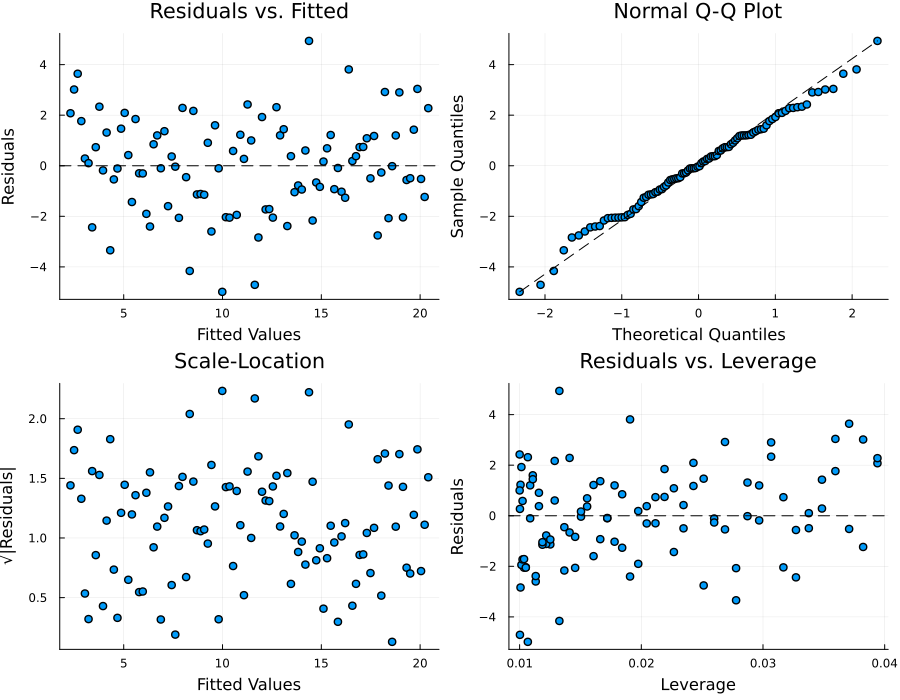

In [147]:
residuals = y - y_pred

p2 = plot(
    layout=(2, 2),
    size=(900, 700),
    title=["Residuals vs. Fitted" "Normal Q-Q Plot" "Scale-Location" "Residuals vs. Leverage"],
    legend=false
)


scatter!(
    p2[1],
    y_pred,
    residuals,
    xlabel="Fitted Values",
    ylabel="Residuals",
    title="Residuals vs. Fitted"
)
hline!(p2[1], [0], linestyle=:dash, color=:black)


theoretical_quantiles = quantile.(Normal(), (1:n) ./ (n+1))
sorted_residuals = sort(residuals)
scatter!(
    p2[2],
    theoretical_quantiles,
    sorted_residuals,
    xlabel="Theoretical Quantiles",
    ylabel="Sample Quantiles",
    title="Normal Q-Q Plot"
)

min_q = minimum(theoretical_quantiles)
max_q = maximum(theoretical_quantiles)
min_r = minimum(sorted_residuals)
max_r = maximum(sorted_residuals)
slope = (max_r - min_r) / (max_q - min_q)
intercept = min_r - slope * min_q
plot!(p2[2], theoretical_quantiles, intercept .+ slope .* theoretical_quantiles, linestyle=:dash, color=:black)


sqrt_abs_residuals = sqrt.(abs.(residuals))
scatter!(
    p2[3],
    y_pred,
    sqrt_abs_residuals,
    xlabel="Fitted Values",
    ylabel="√|Residuals|",
    title="Scale-Location"
)



X = hcat(ones(n), x)
H = X * inv(X'X) * X'
leverage = diag(H)

scatter!(
    p2[4],
    leverage,
    residuals,
    xlabel="Leverage",
    ylabel="Residuals",
    title="Residuals vs. Leverage"
)
hline!(p2[4], [0], linestyle=:dash, color=:black)


In [148]:
n = 200
x1 = range(0, 10, length=n)
x2 = range(5, 15, length=n)
x3 = rand(n) .* 10

β₀ = 3.0  
β₁ = 2.0   
β₂ = -1.5 
β₃ = 0.5    


ϵ = rand(Normal(0, 3), n)  
y_multi = β₀ .+ β₁ .* x1 .+ β₂ .* x2 .+ β₃ .* x3 .+ ϵ

df_multi = DataFrame(Y=y_multi, X1=x1, X2=x2, X3=x3)

multi_model = lm(@formula(Y ~ X1 + X2 + X3), df_multi)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

Y ~ 1 + X1 + X2 + X3

Coefficients:
─────────────────────────────────────────────────────────────────────────────
                 Coef.   Std. Error       t  Pr(>|t|)   Lower 95%   Upper 95%
─────────────────────────────────────────────────────────────────────────────
(Intercept)   0.0       NaN          NaN       NaN     NaN         NaN
X1            1.4074      0.180076     7.82    <1e-12    1.05228     1.76252
X2           -0.884986    0.119694    -7.39    <1e-11   -1.12103    -0.64894
X3            0.484255    0.0780312    6.21    <1e-08    0.330371    0.638138
─────────────────────────────────────────────────────────────────────────────

In [149]:
y_multi_pred = predict(multi_model)


200-element Vector{Float64}:
  0.3030083373777055
 -3.94457326902909
 -0.5174245501361181
 -0.9484093288258384
 -0.6510428257371115
 -3.111335068503513
 -0.8444535890720055
 -1.2298078138556017
 -2.0576963674198963
 -3.3336000109118054
  ⋮
  3.574941716271235
  1.6129709000948118
  3.506050026688289
  1.6957616713799517
  4.247262973213292
  2.522420071472734
  5.218193701661908
  5.535379070374638
  0.8223337704983162

In [150]:
multi_r2 = r2(multi_model)


0.28756024242428957

In [152]:
n = 100
x_poly = range(-5, 5, length=n)
β₀ = 1.0       
β₁ = 0.5     
β₂ = 0.5     
ϵ = rand(Normal(0, 2), n)  
y_poly = β₀ .+ β₁ .* x_poly .+ β₂ .* x_poly.^2 .+ ϵ

 df_poly = DataFrame(X=x_poly, Y=y_poly)

 linear_model = lm(@formula(Y ~ X), df_poly)
println("Linear Model:")
println(linear_model)
println("  R²: $(round(r2(linear_model), digits=4))")

 quadratic_model = lm(@formula(Y ~ X + X^2), df_poly)
println("\nQuadratic Model:")
println(quadratic_model)
println("  R²: $(round(r2(quadratic_model), digits=4))")

 cubic_model = lm(@formula(Y ~ X + X^2 + X^3), df_poly)
println("\nCubic Model:")
println(cubic_model)
println("  R²: $(round(r2(cubic_model), digits=4))")

y_linear_pred = predict(linear_model)
y_quadratic_pred = predict(quadratic_model)
y_cubic_pred = predict(cubic_model)


Linear Model:
StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

Y ~ 1 + X

Coefficients:
────────────────────────────────────────────────────────────────────────
                Coef.  Std. Error      t  Pr(>|t|)  Lower 95%  Upper 95%
────────────────────────────────────────────────────────────────────────
(Intercept)  5.29469     0.440559  12.02    <1e-20   4.42041    6.16896
X            0.458583    0.151095   3.04    0.0031   0.158739   0.758427
────────────────────────────────────────────────────────────────────────
  R²: 0.0859

Quadratic Model:
StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

Y ~ 1 + X + :(X ^ 2)

Coefficients:
────────────────────────────────────────────────────────────────────────
                Coef.  Std

100-element Vector{Float64}:
 11.149190548832651
 10.70677117175578
 10.274017403663105
  9.850939852623386
  9.437549126705372
  9.033855833977823
  8.639870582509495
  8.255603980369148
  7.881066635625535
  7.5162691563474135
  ⋮
 11.758417258007958
 12.239008340050965
 12.73023036533501
 13.232093941928857
 13.744609677901261
 14.267788181320975
 14.801640060256755
 15.346175922777363
 15.90140637695155

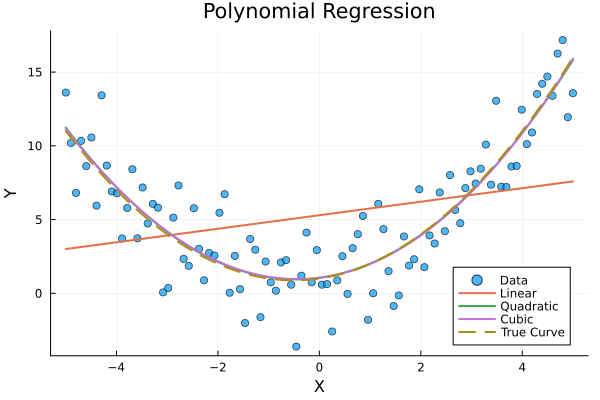

In [153]:
p4 = scatter(
    x_poly, y_poly,
    title="Polynomial Regression",
    xlabel="X",
    ylabel="Y",
    label="Data",
    alpha=0.7
)


plot!(
    p4,
    x_poly,
    y_linear_pred,
    label="Linear",
    linewidth=2
)

plot!(
    p4,
    x_poly,
    y_quadratic_pred,
    label="Quadratic",
    linewidth=2
)

plot!(
    p4,
    x_poly,
    y_cubic_pred,
    label="Cubic",
    linewidth=2
)


plot!(
    p4,
    x_poly,
    β₀ .+ β₁ .* x_poly .+ β₂ .* x_poly.^2,
    label="True Curve",
    linewidth=2,
    linestyle=:dash
)


In [155]:
aic_linear = aic(linear_model)
aic_quadratic = aic(quadratic_model)
aic_cubic = aic(cubic_model)

bic_linear = bic(linear_model)
bic_quadratic = bic(quadratic_model)
bic_cubic = bic(cubic_model)

460.1433663279937

In [157]:
println(aic_cubic)
println(aic_quadratic)

447.11751539805323
445.1415728016991


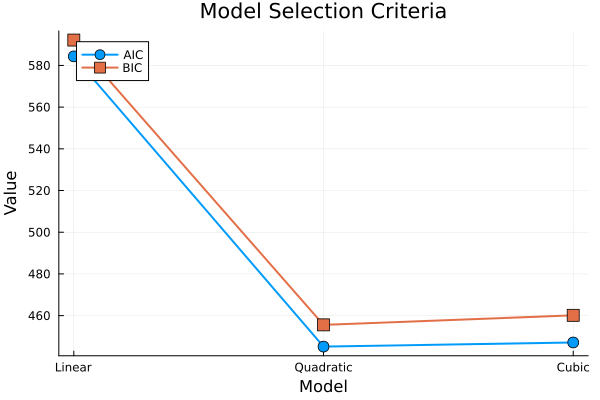

In [158]:
p5 = plot(
    ["Linear", "Quadratic", "Cubic"],
    [aic_linear, aic_quadratic, aic_cubic],
    title="Model Selection Criteria",
    xlabel="Model",
    ylabel="Value",
    label="AIC",
    linewidth=2,
    marker=:circle,
    markersize=6,
    legend=:topleft
)

plot!(
    p5,
    ["Linear", "Quadratic", "Cubic"],
    [bic_linear, bic_quadratic, bic_cubic],
    label="BIC",
    linewidth=2,
    marker=:square,
    markersize=6
)


In [159]:
n = 200
x1_int = rand(Uniform(-2, 2), n)
x2_int = rand(Uniform(-2, 2), n)

 β₀ = 1.0     
β₁ = 2.0   
β₂ = -1.0  
β₃ = 1.5  

 ϵ = rand(Normal(0, 1), n)  
y_int = β₀ .+ β₁ .* x1_int .+ β₂ .* x2_int .+ β₃ .* x1_int .* x2_int .+ ϵ

 df_int = DataFrame(Y=y_int, X1=x1_int, X2=x2_int)

 no_interaction_model = lm(@formula(Y ~ X1 + X2), df_int)
println("Model without interaction:")
println(no_interaction_model)
println("  R²: $(round(r2(no_interaction_model), digits=4))")


Model without interaction:
StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

Y ~ 1 + X1 + X2

Coefficients:
─────────────────────────────────────────────────────────────────────────
                Coef.  Std. Error       t  Pr(>|t|)  Lower 95%  Upper 95%
─────────────────────────────────────────────────────────────────────────
(Intercept)   1.0233     0.155111    6.60    <1e-09   0.717406    1.32919
X1            2.26839    0.133775   16.96    <1e-39   2.00457     2.5322
X2           -1.33817    0.133679  -10.01    <1e-18  -1.60179    -1.07454
─────────────────────────────────────────────────────────────────────────
  R²: 0.6662


In [160]:
interaction_model = lm(@formula(Y ~ X1 + X2 + X1 & X2), df_int)
println("\nModel with interaction:")
println(interaction_model)
println("  R²: $(round(r2(interaction_model), digits=4))")

 x1_grid = range(-2, 2, length=20)
x2_grid = range(-2, 2, length=20)
grid_points = [(x1, x2) for x1 in x1_grid, x2 in x2_grid]

 z_no_int = [predict(no_interaction_model, DataFrame(X1=[p[1]], X2=[p[2]]))[1] for p in grid_points]
z_int = [predict(interaction_model, DataFrame(X1=[p[1]], X2=[p[2]]))[1] for p in grid_points]


Model with interaction:
StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

Y ~ 1 + X1 + X2 + X1 & X2

Coefficients:
──────────────────────────────────────────────────────────────────────────
                 Coef.  Std. Error       t  Pr(>|t|)  Lower 95%  Upper 95%
──────────────────────────────────────────────────────────────────────────
(Intercept)   0.994284   0.0731908   13.58    <1e-29   0.849942   1.13863
X1            2.03242    0.0637534   31.88    <1e-78   1.90669    2.15815
X2           -0.946613   0.064811   -14.61    <1e-32  -1.07443   -0.818796
X1 & X2       1.47068    0.0560292   26.25    <1e-65   1.36018    1.58118
──────────────────────────────────────────────────────────────────────────
  R²: 0.9261


20×20 Matrix{Float64}:
 4.7054   3.88688  3.06836  2.24984  …  -9.20946   -10.028    -10.8465
 4.51404  3.76071  3.00737  2.25403     -8.29271    -9.04605   -9.79939
 4.32269  3.63453  2.94638  2.25822     -7.37597    -8.06412   -8.75228
 4.13133  3.50836  2.88538  2.26241     -6.45922    -7.08219   -7.70517
 3.93997  3.38218  2.82439  2.2666      -5.54247    -6.10026   -6.65805
 3.74862  3.25601  2.7634   2.27079  …  -4.62573    -5.11833   -5.61094
 3.55726  3.12983  2.70241  2.27498     -3.70898    -4.13641   -4.56383
 3.3659   3.00366  2.64142  2.27917     -2.79223    -3.15448   -3.51672
 3.17455  2.87748  2.58042  2.28336     -1.87549    -2.17255   -2.46961
 2.98319  2.75131  2.51943  2.28755     -0.95874    -1.19062   -1.4225
 2.79183  2.62514  2.45844  2.29174  …  -0.041994   -0.20869   -0.375385
 2.60047  2.49896  2.39745  2.29593      0.874753    0.77324    0.671726
 2.40912  2.37279  2.33646  2.30013      1.7915      1.75517    1.71884
 2.21776  2.24661  2.27546  2.30432      

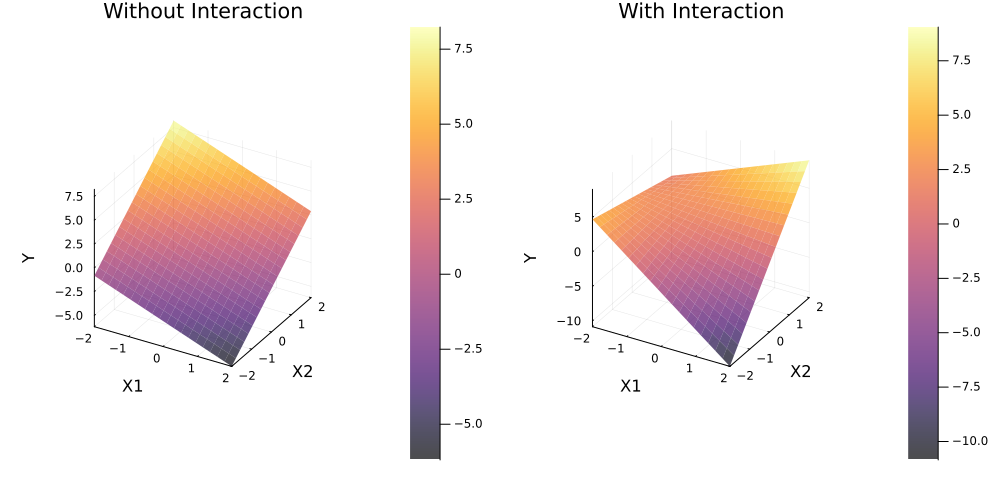

In [161]:
p6 = plot(
    layout=(1, 2),
    size=(1000, 500),
    title=["Without Interaction" "With Interaction"]
)

 surface!(
    p6[1],
    x1_grid,
    x2_grid,
    reshape(z_no_int, (length(x1_grid), length(x2_grid))),
    title="Without Interaction",
    xlabel="X1",
    ylabel="X2",
    zlabel="Y",
    alpha=0.7
)

 surface!(
    p6[2],
    x1_grid,
    x2_grid,
    reshape(z_int, (length(x1_grid), length(x2_grid))),
    title="With Interaction",
    xlabel="X1",
    ylabel="X2",
    zlabel="Y",
    alpha=0.7
)


In [164]:
n = 100
x_wls = range(0, 10, length=n)
β₀ = 2.0     
β₁ = 1.5    

 σ = 0.5 .+ 0.5 .* x_wls
ϵ = [rand(Normal(0, σ[i])) for i in 1:n]

y_wls = β₀ .+ β₁ .* x_wls .+ ϵ

 df_wls = DataFrame(X=x_wls, Y=y_wls)

 ols_model_wls = lm(@formula(Y ~ X), df_wls)
println("OLS Model:")
println(ols_model_wls)

 weights = 1 ./ (0.5 .+ 0.5 .* x_wls).^2

 wls_model = lm(@formula(Y ~ X), df_wls, wts=weights)
println("\nWeighted Least Squares Model:")
println(wls_model)

 y_ols_pred_wls = predict(ols_model_wls)
y_wls_pred = predict(wls_model)


OLS Model:
StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

Y ~ 1 + X

Coefficients:
───────────────────────────────────────────────────────────────────────
               Coef.  Std. Error      t  Pr(>|t|)  Lower 95%  Upper 95%
───────────────────────────────────────────────────────────────────────
(Intercept)  1.57866    0.591353   2.67    0.0089   0.405136    2.75218
X            1.68693    0.102168  16.51    <1e-29   1.48419     1.88968
───────────────────────────────────────────────────────────────────────

Weighted Least Squares Model:
StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

Y ~ 1 + X

Coefficients:
───────────────────────────────────────────────────────────────────────
               Coef.  Std. Error      t  Pr(>|

100-element Vector{Float64}:
  2.069775973497906
  2.22768178071936
  2.3855875879408135
  2.543493395162267
  2.7013992023837203
  2.859305009605174
  3.0172108168266276
  3.1751166240480813
  3.3330224312695345
  3.490928238490988
  ⋮
 16.43920443065018
 16.597110237871632
 16.755016045093086
 16.91292185231454
 17.070827659535993
 17.228733466757447
 17.3866392739789
 17.544545081200354
 17.702450888421808